# Project Name: Infected Tweets -- Analysis of Randomly Sampled Tweets to Determine COVID-19 Subject Matter

# Problem Statement

When the COVID-19 pandemic is running rampant, current information is paramount for staying safe. Graphs and models are created daily, producing figures relied on by hospitals and government agencies. Although this data is official, it does not tell the entire story of outbreak impact. On social media, specifically Twitter, people are talking about their experience with COVID-19.

As a team of data scientists working for the CDC, we are tasked with creating a model that can dynamically classify Tweets as COVID-related. To solve this unsupervised learning problem we will train a w2v vectorizer on COVID-19 related tweets and use the weights of those words in a DBscan cluster. We will then check the Tweet clusters to assess relationships, and determine which clusters are our targets.

## Executive Summary 

Our data was pulled from Twitter using the twitterscraper Python library and a custom wrapper function. We prepared two datasets separately, one with high bias based on targeted terms to get 100k tweets specifically related to COVID-19, and one with high variance using 50 randomly generated terms to get 200k "random" sampling of Tweets, then combined the bias and variance sets to create a final testing set. We additionally ran the two datasets through two cleaners, one to purge duplicate tweets that may have been caught multiple times during the query process, and one to remove common stopwords from the tweet text.

Once our datasets were gathered, we ran a word2vec vectorizer on every word in the corpus. Using that guidance, we then ran a word2vec vectorizer on each Tweet, and then used those vectors in a DBScan model to determine clusters that were related to personal COVID tweets (our identification target), tweets about COVID (such as news tweets, or tweets about political figures central to the COVID response), and noise or other clusters our model decided to create. We used a K-means clusterizer in the early stages of our modeling, but since we didn't know how many clusters we were targeting with our larger sets, we couldn't properly use the model anymore.

Our final model was able to successfully determine our target as Cluster 0, though there were some patterns that showed up that with more optimization we could likely remove. For example, our model created unique clusters for spam tweets (unique tweets of copy-and-pasted text), that for all intents and purposes are duplicates but which our cleaner didn't catch because each one had a unique Tweet ID. The data collection tool includes geolocation functions that we didn't utilize fully in this proof-of-concept, but those tools if utilized correctly could allow this model to be scaled from a municipality all the way to national level.

## Contents:

 - **[Problem Statement](#Problem-Statement)**.
 
 - **[Executive Summary](#Executive-Summary)**.  
   
 - **[Data Dictionary](#Data-Dictionary)**.
 
   
 - **[Data Cleaning and EDA](#Data-Cleaning-and-EDA)**.   
 
   - **[Importing Libraries](#Importing-Libraries)**.  
   - **[Define Data Cleaning Function](#Define-Data-Cleaning-Function)**.  
   - **[Import and Clean Datasets](#Import-and-Clean-Datasets)**.
   - **[Concatenate and Review Cleaned Sets](#Concatenate-and-Review-Cleaned-Sets)**.  
  
  
 - **[Vectorizer Models](#Vectorizer-Models)**.   
 
   - **[Word Vectorizer](#Word-Vectorizer)**.  
   - **[Tweet Vectorizer](#Tweet-Vectorizer)**.  

- **[Modeling](#Modeling)**.   
  
   - **[Model Preparation](#Model-Preparation)**. 
   - **[K-Means Clustering with Scikit-learn Library](#K-Means-Clustering-with-Scikit-learn-Library)**. 
   - **[DBSCAN](#DBSCAN)**.    
   
   
- **[Model Evaluation](#Model-Evaluation)**.  

- **[Conclusions and Recommendations](#Conclusions-and-Recommendations)**.  

- **[References](#References)**.

## Data Dictionary

| Data Name | Data Type | Description |
|---|---|---|
| tweet_id | int64 | The unique identifier of a given tweet. |
| username | object | The username of the tweet's poster. |
| text | object | The text of the tweet. |
| tweet_date | object | The date the tweet was posted. |
| search_term | object | The term being queried when the tweet was scraped. |  
| city | object | The city or area corresponding to the lat/long coordinates used in the query that yielded the tweet. |  
| lat | float64 | Latitude coordinate used during the query. |  
| long | float64 | Longitude coordinate used during the query. |  
| radius | object | The radius around the lat/long point used during the query. |  
| query_start | object | The date used in the query. The scraper then works in 3-day increments from the query_start date to the present date. |
| token_text | object | The tokenized version of the text column. |  
| stop_text | list | The tokenized text with stopwords removed. |  
| cluster | int64 | The DBScan cluster the tweet was assigned to. |

## Data Cleaning and EDA

### Importing Libraries

In [2]:
import warnings
warnings.filterwarnings("ignore")


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import gensim
import re
from gensim.models.word2vec import Word2Vec 
from nltk.tokenize import RegexpTokenizer 
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.stem.snowball import EnglishStemmer
from nltk.corpus import stopwords
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")
from nltk.tokenize import TweetTokenizer # a tweet tokenizer from nltk.
tokenizer = TweetTokenizer()
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.cluster import KMeansClusterer
import nltk

#from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN , KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split

#from sklearn.datasets import make_blobs
#from sklearn.linear_model import LogisticRegression
#from sklearn.decomposition import PCA

RANDOM_STATE = 7777
%matplotlib inline


### Define Data Cleaning Function

In [3]:
def stop_word_remover(df):
    
    #Initial check of shapes to confirm duplicate drops
    print(f'Initial Data Shape: {df.shape}')
    df.drop_duplicates(inplace = True)
    print(f'Shape without Duplicates: {df.shape}')
    
    #Correct for text with regex
    df['text'] = df['text'].astype(str).str.lower()
    df['token_text'] = df['text'].str.replace('([^ a-zA-Z0-9])', '').str.replace('http\S+|www.\S+', '', case=False).replace('coronavirus', 
                                                                                                                            'covid19')
    #Drop stopwords
    stop = stopwords.words('english')
    df['stop_text'] = df['token_text'].apply(lambda x: [item for item in str(x).split() 
                                                    if item not in stop])
    return df

In order to get the most out of the data the word 2 vec vectorizer that we will be using later in this project the data must be cleansed. The function above removes non alphnumeric characters from the data and then gets rid of all of the urls by using a regex tokenizer. The tokenized data then has all of the stop words removed and a clean data frame is returned.

### Import and Clean Datasets

In [3]:
df1 = pd.read_csv('../adam/datasets/scrape_5.12.csv')
pd.set_option('display.max_colwidth', -1)

C:\Users\adamr\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


The data set df1 is built from a list words that when queried on twitter will return tweets that are associated with covid-19. This data set is used to build our word 2 vec vectorizer's vocab so we can distinguish a cluster of what a tweet is talking about.

In [7]:
df2 = pd.read_csv('../adam/datasets/test_5.14.csv')
pd.set_option('display.max_colwidth', -1)

C:\Users\adamr\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


The data set df2 is built from a list of random words that when queried on twitter will return random tweets concerning many different topics. This data set is used to test whether or not the clusters created from the word 2 vec vocabulary are good choices.

In [4]:
df1.shape

(121482, 10)

The biased data set has 121,482 records before duplicates are removed

In [5]:
#remove duplicate tweets
df1.drop_duplicates(inplace=True)
df1.shape

(114044, 10)

The biased data set has 114,044 records after duplicates are removed

In [6]:
df1 = stop_word_remover(df1)

In [8]:
df2.shape

(221214, 10)

The variance data set has 221,214 records before duplicates are removed

In [9]:
#remove duplicate tweets
df2.drop_duplicates(inplace=True)
df2.shape

(201794, 10)

The variance data set has 201,794 records after duplicates are removed

In [10]:
df2 = stop_word_remover(df2)

### Concatenate and Review Cleaned Sets

In [11]:
df = pd.concat([df1,df2], ignore_index = True, verify_integrity = True)
df.shape

(315838, 12)

The bias and variance data set are combined to create the complete data set. This data set will be used to test whether or not the vocab based off the bias data set can filter out covid tweets from a large pool of tweets.

In [12]:
df['text'].head()

0    did the first of several shopping runs, though i ended up walking out of cvs without buying anything. if the rate of people coughing at me is any indication, we’ll all have covid-19 by thursday. \n\ncover your fucking mouths when you cough.
1    looks like adios muchachos for the us #covid #covid19us #coronavirushttps://twitter.com/nytimes/status/1234171621696557057 …                                                                                                                    
2    humour..snl...on #covid #coronavirususahttps://mashable.com/video/snl-coronavirus-democratic-candidates-cold-open/ …                                                                                                                            
3    had to go to three diff convenient stores to find real milk (not soy) and they were all out of the lower priced non organic stuff .. i buy organic so i was fine with it but wow. covid 19 panic buying begins in manhattan.                    
4    #covid #cor

Raw tweet text data

In [14]:
df['token_text'].head()

0    did the first of several shopping runs though i ended up walking out of cvs without buying anything if the rate of people coughing at me is any indication well all have covid19 by thursday cover your fucking mouths when you cough
1    looks like adios muchachos for the us covid covid19us coronavirus                                                                                                                                                                    
2    humoursnlon covid coronavirususa                                                                                                                                                                                                     
3    had to go to three diff convenient stores to find real milk not soy and they were all out of the lower priced non organic stuff  i buy organic so i was fine with it but wow covid 19 panic buying begins in manhattan               
4    covid coronovirius in nursing home setting  kirkland mo

Urls and non alphanumeric characters are removed from the raw tweet text

In [13]:
df['stop_text'].head()

0    [first, several, shopping, runs, though, ended, walking, cvs, without, buying, anything, rate, people, coughing, indication, well, covid19, thursday, cover, fucking, mouths, cough]
1    [looks, like, adios, muchachos, us, covid, covid19us, coronavirus]                                                                                                                  
2    [humoursnlon, covid, coronavirususa]                                                                                                                                                
3    [go, three, diff, convenient, stores, find, real, milk, soy, lower, priced, non, organic, stuff, buy, organic, fine, wow, covid, 19, panic, buying, begins, manhattan]              
4    [covid, coronovirius, nursing, home, setting, kirkland, 50, symptoms, 3120]                                                                                                         
Name: stop_text, dtype: object

Stop words removed and tweet text split in order to feed it into the word 2 vec vectorizer

## Vectorizer Models

### Word Vectorizer

In [15]:
sent = [row for row in df1['stop_text']]

Creates a list of the lists of words found in the stop_text column of the bias data set df1. This list is what the word 2 vec will create the vectors off of using cosine similarity.

In [16]:
# variable set to the number of dimensions the word 2 vec is using
# this will be used later as well so it is saved as a global variable
dims = 300

In [17]:
tweet_w2v = Word2Vec(size=dims, min_count=500, window=10)

Instantiate model using the dims variable set to 300, minimum count set to 500 and the window set to 10. The dims are the number of dimensions that the word vectors will have. This parameter will help determine the cosine similarity score because the larger it is the more words it it finds vectorized similarities to. The min_count parameter determines the minimum number of occurences a word has to have in order for it to be considered in the vectorizer. The window is how far away a word can be from another to be considered for vectorizing. After much tuning and research the parameters we chose have proven to return the best results for this particular problem.

In [18]:
tweet_w2v.build_vocab(sent)

The tweet_w2v is then fit with the sent list as the sentences input for vectorization. This function builds the vocab of the sentences for the model created. 

In [19]:
tweet_w2v.most_similar('covid')

C:\Users\adamr\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('america', 0.1774219572544098),
 ('trumps', 0.15831056237220764),
 ('going', 0.1576019823551178),
 ('treatment', 0.1463635116815567),
 ('today', 0.13153408467769623),
 ('found', 0.12964557111263275),
 ('become', 0.12547096610069275),
 ('socialdistancing', 0.12408412247896194),
 ('already', 0.12144090980291367),
 ('says', 0.11682413518428802)]

When looking for words that are most similar to each other with respect to our tweet_w2v vectorizer, we can search a term and have the most similar words returned. This function returns a touple of the similar word following by the cosine similarity score to the searched term. The list is ordered from highest to lowest with respect to cosine similarity.  
  
In order to create query terms for the bias data set we ran this function multiple times. It returns both words and hashtags, which were then added to the query list in our tweet scraping module. Using this technique wer were able to expand our bias data set from 51k tweets to over 121k tweets.

### Tweet Vectorizer

In [20]:
# Functions found in this cell were created by instructor Noah Christiansen
# He is great
# Define vectorization function
#word2vecmodel = tweet_w2v
def vectorize_corpus(keyword_list):    
    # Instantiate counter for number of words in keyword_list that exists
    n_words = 0
    # Create template for cumulative corpus vector sum
    corpus_vec_sum = np.zeros((1,dims))                 
    # Scan through each word in list
    for word in keyword_list:
        if word in tweet_w2v.wv.vocab:                    
            word_vec = tweet_w2v.wv.word_vec(word)
            #print(word_vec)
            n_words +=1                                
            corpus_vec_sum = corpus_vec_sum + word_vec 
    # Compute average vector by taking cumulative vector sum and dividing it by number of words traced
    corpus_avg_vec = corpus_vec_sum/n_words
    # Squeeze this N-dimensional nested array object into a 1-D array to streamline future processing
    corpus_avg_vec = np.squeeze(corpus_avg_vec)
    return(corpus_avg_vec)

#defining cosine similarity function
def cos_sim(vector_1, vector_2):
    dp = np.dot(vector_1, vector_2)
    magnitude_v1 = np.sqrt(np.dot(vector_1,vector_1))
    magnitude_v2 = np.sqrt(np.dot(vector_2,vector_2))
    return(dp/(magnitude_v1*magnitude_v2))


In [21]:
vect_tweets = [vectorize_corpus(tweet) for tweet in df['stop_text']]
vect_df = pd.DataFrame(vect_tweets)

C:\Users\adamr\anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


To determine which tweets are most likely concerning covid, we created a function that vectorized the body of the tweets based on the vectorized bias data set vocab. After the tweet body is vectorized the cosine similarity of each tweet vector was assigned to each dimension. These values were then saved to a data frame that will be used for the clustering algorithms.

In [23]:
join_df = df.join(vect_df)
join_df.dropna(inplace = True)
join_df.shape

(293497, 312)

Null values were created in the vector_df which need to be removed. The complete data frame is associated to it and must maintain the same shape as the vector_df. In order to do this the two data frames were joined before data is removed. When the dropna function is run, it drops data for both data sets at the same time keeping the inegrity of the indices intact.

In [24]:
clean_vec_df= join_df.iloc[:, [i for i in range(13,(dims+12))]]
clean_og_df = join_df.iloc[:, [i for i in range(0,12)]]
clean_vec_df.head()

,1,2,3,4,5,6,7,8,9,10,...,290,291,292,293,294,295,296,297,298,299
0,0.000036,-0.000318,-0.000159,-0.000425,0.000237,0.000169,-0.000201,-0.000051,-0.000067,0.000510,...,-0.000107,0.000111,0.000009,-0.000047,0.000154,-0.000091,-0.000100,0.000008,0.000212,0.000752
1,0.000184,-0.000228,0.000042,-0.000009,0.000122,-0.000426,-0.000161,-0.000141,0.000470,-0.000351,...,0.000646,0.000715,-0.000258,-0.000621,-0.000584,-0.000349,-0.000400,0.000185,0.000665,0.000882
2,0.000271,-0.000080,-0.001618,0.000013,-0.000597,-0.000060,-0.000231,-0.001556,-0.000579,-0.000073,...,0.000895,0.001244,0.000246,0.000535,-0.001173,-0.001518,-0.000017,-0.000595,0.001266,0.000610
3,0.000576,-0.000205,-0.000070,-0.000082,-0.000107,0.000277,0.000405,-0.000229,0.000167,-0.000346,...,0.000017,0.000487,0.000124,0.000656,-0.000577,-0.000370,0.000295,-0.000323,-0.000345,-0.000208
4,0.000431,-0.000456,-0.001382,0.000116,-0.000748,-0.000358,-0.000909,0.000350,0.000042,0.000065,...,0.000661,0.000008,-0.000140,-0.000209,-0.000455,0.000587,0.000043,0.000705,0.000736,0.000214


In [25]:
clean_og_df.head()

,tweet_id,username,text,tweet_date,search_term,city,lat,long,radius,query_start,token_text,stop_text
0,1234258409408602118,e.p.c.,"did the first of several shopping runs, though i ended up walking out of cvs without buying anything. if the rate of people coughing at me is any indication, we’ll all have covid-19 by thursday. \n\ncover your fucking mouths when you cough.",2020-03-01 23:25:10,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,did the first of several shopping runs though i ended up walking out of cvs without buying anything if the rate of people coughing at me is any indication well all have covid19 by thursday cover your fucking mouths when you cough,"[first, several, shopping, runs, though, ended, walking, cvs, without, buying, anything, rate, people, coughing, indication, well, covid19, thursday, cover, fucking, mouths, cough]"
1,1234253374725459968,@geminiwoe,looks like adios muchachos for the us #covid #covid19us #coronavirushttps://twitter.com/nytimes/status/1234171621696557057 …,2020-03-01 23:05:10,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,looks like adios muchachos for the us covid covid19us coronavirus,"[looks, like, adios, muchachos, us, covid, covid19us, coronavirus]"
2,1234241890700218370,enigma4ever 🌹🆘 🌊 🕊️🍑👩‍⚕️💉😷,humour..snl...on #covid #coronavirususahttps://mashable.com/video/snl-coronavirus-democratic-candidates-cold-open/ …,2020-03-01 22:19:32,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,humoursnlon covid coronavirususa,"[humoursnlon, covid, coronavirususa]"
3,1234238588474331136,° ° °,had to go to three diff convenient stores to find real milk (not soy) and they were all out of the lower priced non organic stuff .. i buy organic so i was fine with it but wow. covid 19 panic buying begins in manhattan.,2020-03-01 22:06:25,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,had to go to three diff convenient stores to find real milk not soy and they were all out of the lower priced non organic stuff i buy organic so i was fine with it but wow covid 19 panic buying begins in manhattan,"[go, three, diff, convenient, stores, find, real, milk, soy, lower, priced, non, organic, stuff, buy, organic, fine, wow, covid, 19, panic, buying, begins, manhattan]"
4,1234238537068883968,enigma4ever 🌹🆘 🌊 🕊️🍑👩‍⚕️💉😷,"#covid #coronovirius in nursing home setting , #kirkland more than 50 with symptoms ..3/1/20https://www.statnews.com/2020/02/29/new-covid-19-death-raises-concerns-about-virus-spread-in-nursing-homes/ …",2020-03-01 22:06:12,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,covid coronovirius in nursing home setting kirkland more than 50 with symptoms 3120,"[covid, coronovirius, nursing, home, setting, kirkland, 50, symptoms, 3120]"


After the null values were removed the data set was then split back into 2 different data sets using the iloc function. The clean complete data set was saved as clean_og_df and the vectorized data was saved as clean_vec_df, which will be used in the clustering algorithms.

## Modeling

### Model Preparation

In [18]:
X = clean_vec_df

### K-Means Clustering with Scikit-learn Library

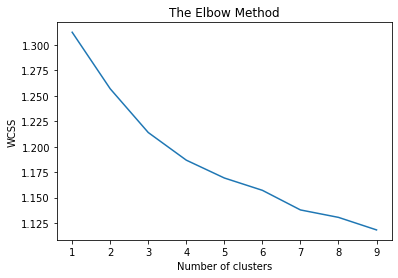

In [21]:
# #Fit a k-means clustering model
#within cluster sum of squares(wcss)
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init='k-means++',
                    n_init=10,
                   random_state= RANDOM_STATE)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel("Number of clusters")
plt.ylabel('WCSS')
plt.show()

For finding the optimum number of centroids, the ‘elbow method’ is used. In it, the SSE value(sum of squared error) is calculated for different values of k (i.e no. of clusters) by clustering the dataset following each value of k.Thus, by looking at the graph, the total number of clusters is found to be 4.

In [43]:
n_clusters = 4
K = KMeans(n_clusters = n_clusters,
          max_iter = 100,
          init = 'k-means++',
          n_init = 1)
labels = K.fit_predict(X)
print(labels)
for index, sent in enumerate(sent):
    print(str(labels[index]) + ":" + str(sent))

[3 3 3 ... 3 3 3]
3:['first', 'several', 'shopping', 'runs', 'though', 'ended', 'walking', 'cvs', 'without', 'buying', 'anything', 'rate', 'people', 'coughing', 'indication', 'well', 'covid19', 'thursday', 'cover', 'fucking', 'mouths', 'cough']
3:['looks', 'like', 'adios', 'muchachos', 'us', 'covid', 'covid19us', 'coronavirus']
3:['humoursnlon', 'covid', 'coronavirususa']
3:['go', 'three', 'diff', 'convenient', 'stores', 'find', 'real', 'milk', 'soy', 'lower', 'priced', 'non', 'organic', 'stuff', 'buy', 'organic', 'fine', 'wow', 'covid', '19', 'panic', 'buying', 'begins', 'manhattan']
3:['covid', 'coronovirius', 'nursing', 'home', 'setting', 'kirkland', '50', 'symptoms', '3120']
1:['kofi', 'anan', 'epidemics', 'like', 'covid19', 'problems', 'without', 'passports', 'tall', 'walls', 'immigration', 'officials', 'keep', 'funds4researchletscienceeducatelawmakerscc', 'drriveramindt', '6dm4cnyconnections', 'emorycfar']
3:['nurse', 'encouraging', 'people', 'protect', 'especially', 'immune', 'i

IndexError: index 107799 is out of bounds for axis 0 with size 107799

In [29]:
clean_og_df['KMeans_cluster'] = kmeans.labels_

In [30]:
clean_og_df['KMeans_cluster'].value_counts()

0    51846
6    27550
7    10121
1     6807
2     4347
8     4094
4     2109
3      597
5      328
Name: KMeans_cluster, dtype: int64

In [31]:
mask = clean_og_df['KMeans_cluster'] == 3

In [32]:
clean_og_df[mask].tail()

,tweet_id,username,text,tweet_date,search_term,city,lat,long,radius,query_start,token_text,stop_text,KMeans_cluster
109553,1235252213938900993,Chris Rush,i saw a guy on the subway last night wearing a...,2020-03-04 17:14:12,mask,Westchester Co.,41.1220,-73.7949,20mi,2020-02-01,i saw a guy on the subway last night wearing a...,"[saw, guy, subway, last, night, wearing, surgi...",3
109716,1245916659786764288,S. Henderson,until the higher ups report to work on a nursi...,2020-04-03 03:30:54,n95,Westchester Co.,41.1220,-73.7949,20mi,2020-02-01,until the higher ups report to work on a nursi...,"[higher, ups, report, work, nursing, unit, tol...",3
109868,1250214314558074881,✨✨JV - NYC✨✨,"limited supply of n95 masks, gowns, hardly can...",2020-04-15 00:08:15,N95,Westchester Co.,41.1220,-73.7949,20mi,2020-02-01,limited supply of n95 masks gowns hardly can t...,"[limited, supply, n95, masks, gowns, hardly, t...",3
110507,1250036317355982849,Steve Hou,we are where we are bc the govt got a super la...,2020-04-14 12:20:57,test,Westchester Co.,41.1220,-73.7949,20mi,2020-02-01,we are where we are bc the govt got a super la...,"[bc, govt, got, super, late, start, flunked, t...",3
112088,1248090309159862272,Dan Osorio,who feels like that? geeeez #covid #covid19 #s...,2020-04-09 03:28:12,#COVID,East Hampton,40.9634,-72.1848,20mi,2020-02-01,who feels like that geeeez covid covid19 schoo...,"[feels, like, geeeez, covid, covid19, school, ...",3


In [33]:
kmeans.cluster_centers_

array([[ 8.29445082e-06,  4.38119426e-06,  1.10653161e-05, ...,
        -1.36855717e-05,  3.02451477e-06,  1.47500679e-05],
       [ 1.01147629e-05, -4.62601006e-05, -1.17619440e-05, ...,
        -7.29111157e-06, -6.18117495e-05,  4.27619635e-06],
       [-5.99330228e-05,  8.84279888e-07, -4.73104126e-05, ...,
        -2.77162086e-05,  1.65663534e-04,  1.31715458e-04],
       ...,
       [-2.54794395e-05,  4.10295510e-06, -3.75749704e-06, ...,
        -1.41306531e-05,  5.34820427e-05,  5.04166820e-05],
       [-7.24569250e-06,  9.30752142e-05, -1.46095731e-05, ...,
        -3.01786228e-05, -2.48239665e-05,  1.05324742e-04],
       [ 1.26885494e-04, -8.09160063e-05,  8.49705839e-05, ...,
         3.43292436e-05,  5.11209777e-05,  9.03512628e-05]])

In [23]:
X = np.array(X)

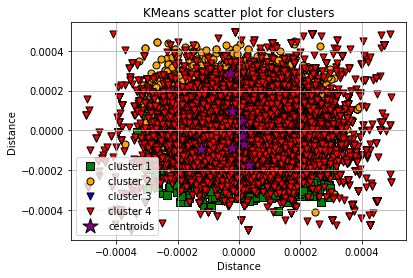

In [27]:
plt.scatter(
    X[kmeans.fit_predict(X) == 0, 0], X[kmeans.fit_predict(X) == 0, 1],
    s=50, c='green',
    marker='s', edgecolor='black',
    label='cluster 1'
)
plt.scatter(
    X[kmeans.fit_predict(X) == 1, 0], X[kmeans.fit_predict(X) == 1, 1],
    s=50, c='orange',
    marker='o', edgecolor='black',
    label='cluster 2'
)
plt.scatter(
    X[kmeans.fit_predict(X) == 2, 0], X[kmeans.fit_predict(X) == 2, 1],
    s=50, c='blue',
    marker='v', edgecolor='black',
    label='cluster 3'
)
plt.scatter(
    X[kmeans.fit_predict(X) == 3, 0], X[kmeans.fit_predict(X) == 3, 1],
    s=50, c='red',
    marker='v', edgecolor='black',
    label='cluster 4'
)
# plot the centroids
plt.scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
    s=250, marker='*',
    c='purple', edgecolor='black',
    label='centroids'
)
plt.xlabel("Distance")
plt.ylabel("Distance")
plt.title("KMeans scatter plot for clusters")
plt.legend(scatterpoints=1)
plt.grid()
plt.show()

### DBSCAN

In [51]:
dbscan = DBSCAN(metric='cosine', eps=0.4, min_samples=20, n_jobs = -1) # you can change these parameters, given just for example 
cluster_labels = dbscan.fit_predict(clean_vec_df) # where X - is your matrix, where each row corresponds to one document (line) from the docs, you need to cluster 

DB scan is a clustering algorithm that creates clusters based on the epsilon radial distance of data points from eachother. If a group of data points fit within that radius and the size of the group is equal to or greter than the minimum sample size, then a cluster is formed.
  
While creating clusters we found 2 issues that were solved during parameter tuning. The first issue was that the noise cluster was way too big. This happens when epsilon is so small that it cannot find enough data points with in a certain distance of another to deem them a cluster. This also happens when min sample is too big, since not many data points may be found epsilon away.
  
Another issue we found was too many clusters. This occured when the epsilon value and the min sample values were both very small. This was resolved by looking at the resulting clusters to find the optimal minimum size and whether or not too much noise was returned.

In [52]:
clean_og_df['cluster'] = cluster_labels

C:\Users\adamr\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [53]:
clean_og_df['cluster'].value_counts()

 0     242166
-1     50734 
 10    84    
 20    49    
 9     39    
 16    35    
 14    30    
 5     28    
 8     27    
 15    25    
 12    25    
 7     25    
 11    24    
 17    23    
 21    21    
 13    21    
 18    21    
 19    20    
 6     20    
 4     20    
 3     20    
 2     20    
 1     20    
Name: cluster, dtype: int64

With epsilon equal to .4 and min size at 20 we are able to identify cluster 0 as the cluster that contains tweets concerning covid 19. This cluster has 242,166 tweets in it.

In [54]:
clean_og_df.head(5)

,tweet_id,username,text,tweet_date,search_term,city,lat,long,radius,query_start,token_text,stop_text,cluster
0,1234258409408602118,e.p.c.,"did the first of several shopping runs, though i ended up walking out of cvs without buying anything. if the rate of people coughing at me is any indication, we’ll all have covid-19 by thursday. \n\ncover your fucking mouths when you cough.",2020-03-01 23:25:10,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,did the first of several shopping runs though i ended up walking out of cvs without buying anything if the rate of people coughing at me is any indication well all have covid19 by thursday cover your fucking mouths when you cough,"[first, several, shopping, runs, though, ended, walking, cvs, without, buying, anything, rate, people, coughing, indication, well, covid19, thursday, cover, fucking, mouths, cough]",-1
1,1234253374725459968,@geminiwoe,looks like adios muchachos for the us #covid #covid19us #coronavirushttps://twitter.com/nytimes/status/1234171621696557057 …,2020-03-01 23:05:10,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,looks like adios muchachos for the us covid covid19us coronavirus,"[looks, like, adios, muchachos, us, covid, covid19us, coronavirus]",0
2,1234241890700218370,enigma4ever 🌹🆘 🌊 🕊️🍑👩‍⚕️💉😷,humour..snl...on #covid #coronavirususahttps://mashable.com/video/snl-coronavirus-democratic-candidates-cold-open/ …,2020-03-01 22:19:32,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,humoursnlon covid coronavirususa,"[humoursnlon, covid, coronavirususa]",0
3,1234238588474331136,° ° °,had to go to three diff convenient stores to find real milk (not soy) and they were all out of the lower priced non organic stuff .. i buy organic so i was fine with it but wow. covid 19 panic buying begins in manhattan.,2020-03-01 22:06:25,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,had to go to three diff convenient stores to find real milk not soy and they were all out of the lower priced non organic stuff i buy organic so i was fine with it but wow covid 19 panic buying begins in manhattan,"[go, three, diff, convenient, stores, find, real, milk, soy, lower, priced, non, organic, stuff, buy, organic, fine, wow, covid, 19, panic, buying, begins, manhattan]",1
4,1234238537068883968,enigma4ever 🌹🆘 🌊 🕊️🍑👩‍⚕️💉😷,"#covid #coronovirius in nursing home setting , #kirkland more than 50 with symptoms ..3/1/20https://www.statnews.com/2020/02/29/new-covid-19-death-raises-concerns-about-virus-spread-in-nursing-homes/ …",2020-03-01 22:06:12,COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,covid coronovirius in nursing home setting kirkland more than 50 with symptoms 3120,"[covid, coronovirius, nursing, home, setting, kirkland, 50, symptoms, 3120]",0


In [72]:
mask = clean_og_df['cluster'] == 10
clean_og_df[mask]['search_term'].value_counts()[:10]

#COVID      55
#covid19    27
COVID       2 
Name: search_term, dtype: int64

In [73]:
clean_og_df[mask].head(5)

,tweet_id,username,text,tweet_date,search_term,city,lat,long,radius,query_start,token_text,stop_text,cluster
1943,1250557400316248066,Ron Waxman 🏳️‍🌈,"i want everyone to understand this. in the midst of #coronaviruspandemic during which tens of thousands of americans are dying, trump’s biggest worry and complaint is getting judges approved! he is unfit for office. #trumppressconf #trumppressconference #covid19 #covid",2020-04-15 22:51:33,#COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,i want everyone to understand this in the midst of coronaviruspandemic during which tens of thousands of americans are dying trumps biggest worry and complaint is getting judges approved he is unfit for office trumppressconf trumppressconference covid19 covid,"[want, everyone, understand, midst, coronaviruspandemic, tens, thousands, americans, dying, trumps, biggest, worry, complaint, getting, judges, approved, unfit, office, trumppressconf, trumppressconference, covid19, covid]",10
1944,1250557334356725763,Ron Waxman 🏳️‍🌈,"i want everyone to understand this. in the midst of #coronaviruspandemic during which tens of thousands of americans are dying, trump’s biggest worry and complaint is getting judges approved! he is unfit for office. #trumppressconf #trumppressconference #covid19 #covid",2020-04-15 22:51:17,#COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,i want everyone to understand this in the midst of coronaviruspandemic during which tens of thousands of americans are dying trumps biggest worry and complaint is getting judges approved he is unfit for office trumppressconf trumppressconference covid19 covid,"[want, everyone, understand, midst, coronaviruspandemic, tens, thousands, americans, dying, trumps, biggest, worry, complaint, getting, judges, approved, unfit, office, trumppressconf, trumppressconference, covid19, covid]",10
1945,1250557294695366656,Ron Waxman 🏳️‍🌈,"i want everyone to understand this. in the midst of #coronaviruspandemic during which tens of thousands of americans are dying, trump’s biggest worry and complaint is getting judges approved! he is unfit for office. #trumppressconf #trumppressconference #covid19 #covid",2020-04-15 22:51:07,#COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,i want everyone to understand this in the midst of coronaviruspandemic during which tens of thousands of americans are dying trumps biggest worry and complaint is getting judges approved he is unfit for office trumppressconf trumppressconference covid19 covid,"[want, everyone, understand, midst, coronaviruspandemic, tens, thousands, americans, dying, trumps, biggest, worry, complaint, getting, judges, approved, unfit, office, trumppressconf, trumppressconference, covid19, covid]",10
1946,1250557259609972736,Ron Waxman 🏳️‍🌈,"i want everyone to understand this. in the midst of #coronaviruspandemic during which tens of thousands of americans are dying, trump’s biggest worry and complaint is getting judges approved! he is unfit for office. #trumppressconf #trumppressconference #covid19 #covid",2020-04-15 22:50:59,#COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,i want everyone to understand this in the midst of coronaviruspandemic during which tens of thousands of americans are dying trumps biggest worry and complaint is getting judges approved he is unfit for office trumppressconf trumppressconference covid19 covid,"[want, everyone, understand, midst, coronaviruspandemic, tens, thousands, americans, dying, trumps, biggest, worry, complaint, getting, judges, approved, unfit, office, trumppressconf, trumppressconference, covid19, covid]",10
1949,1250555276446572552,Ron Waxman 🏳️‍🌈,"i want everyone to understand this. in the midst of #coronaviruspandemic during which tens of thousands of americans are dying, trump’s biggest worry and complaint is getting judges approved! he is unfit for office. #trumppressconf #trumppressconference #covid19 #covid",2020-04-15 22:43:06,#COVID,Brooklyn,40.650002,-73.949997,10mi,2020-02-01,i want ev

The DBscan was also able to accurately cluster out the spam tweets even though they were talking about covid. This is good because the tweets that are in the target cluster are more likely those from people who are real and not robots.

In [56]:
clean_og_df.to_csv(r'./datasets/full_dataset.csv', compression = 'gzip')

## Model Evaluation

 Epsilon value is the maximum relative distance a point can be away from another to be considered part of the same cluster
- Bias set the epsilon was much larger than it is for the Complete data set because of the influx of points making the relative distances in the complete set much larger.
- We will be filling in the number of tweets in each data set in the slide when the dbscan is done running in the morning
- db scan is good because we can see a difference between types of covid tweets for example:
people concerned about covid vs people talking about trump in relation to covid
- Our completed data set also clustered spam tweets and kept them out of the covid positive data set
- Based on the assessments we did for the cluster, we can say with confidence that infected tweets are identified and separated into a cluster and our proof of concept is confirmed!

## Conclusions and Recommendations

Thus Social media posts can be used to determine whether or not covid is in an are.
This unsupervised data set can be clustered and assessed
- Word2Vec Cosine Similar words
- Weighted Tweet Vectorizer
- DBscan autonomous clustering
Using this process we can:
- Separate covid tweets from any area
- Determine severity of outbreak
- Concentration of covid tweets
- Heatmap the locations of virus hotspots
Make a world a better place!


## References

COVID-19 Molecule: https://www.statnews.com/2020/02/11/disease-caused-by-the-novel-coronavirus-has-name-covid-19/  
Word2Vec Image: https://hackernoon.com/word2vec-part-1-fe2ec6514d70  
Black Twitter bird Image: https://webstockreview.net/explore/twitter-bird-png-transparent/